In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 512
import pandas as pd
import matplotlib.colors as colors
from collections import OrderedDict

In [2]:
lambda005 = pd.read_excel("results_lambda=0.05.xlsx") 
del lambda005["Unnamed: 0"]

In [3]:
lambda005

,Model,Oscillatory Level,Initial Condition,RMSE (test)
0,Ridge Regression,Lorenz 100,In-phase,0.021016
1,Ridge Regression,Lorenz 100,Out-of-phase,0.021016
2,Ridge Regression,Lorenz 100,Anti-phase,0.021016
3,Ridge Regression,Lorenz 90,In-phase,0.017556
4,Ridge Regression,Lorenz 90,Out-of-phase,0.017556
...,...,...,...,...
292,Coupled Oscillators (high),Lorenz 20,Out/Out,0.004671
293,Coupled Oscillators (high),Lorenz 20,Out/Anti,0.004424
294,Coupled Oscillators (high),Lorenz 20,Anti/In,0.004615
295,Coupled Oscillators (high),Lorenz 20,Anti/Out,0.004666


In [5]:
def getIndex(dictionary, value):
    for idx, val in enumerate(dictionary.values()):
        if val == value:
            return idx
    return None

In [19]:
Models = {'Ridge Regression' : 'R', 'Single Oscillator' : 'S', 'Uncoupled Oscillators' : 'U', 
          'Coupled Oscillators (low)' : 'CL',  'Coupled Oscillators (high)' : 'CH'}
Rows = {'Ridge Regression' : 4, 'Single Oscillator' : 3, 'Uncoupled Oscillators' : 2, 
          'Coupled Oscillators (low)' : 1,  'Coupled Oscillators (high)' : 0} ####
Levels = ['Lorenz 20', 'Lorenz 30', 'Lorenz 40', 'Lorenz 50', 'Lorenz 60', 'Lorenz 70', 'Lorenz 80', 'Lorenz 90', 'Lorenz 100']

In [35]:
list(range(len(Models)))

[0, 1, 2, 3, 4]

In [33]:
np.zeros((len(Models), len(Levels)))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [6]:
averages = OrderedDict()
for j in range(len(Models)):
    averages.update({list(Models.keys())[j]:np.random.rand()})

In [13]:
for key, value in averages.items():
    print(key, value)

Ridge Regression 0.19737293461507477
Single Oscillator 0.5722332244269331
Uncoupled Oscillators 0.7185061212165437
Coupled Oscillators (low) 0.7570762971164579
Coupled Oscillators (high) 0.37530541629716685


In [16]:
list(averages.items())[0]

('Ridge Regression', 0.19737293461507477)

In [31]:
example = lambda005.loc[(lambda005['Model'] == 'Single Oscillator') & (lambda005['Oscillatory Level'] == 'Lorenz 100'), 'RMSE (test)']

In [48]:
example.mean()

0.015830460333333334

In [49]:
def plotDiagrams(dataframe, threshold = 1e-6):
    
    Models = {'Ridge Regression' : 'R', 'Single Oscillator' : 'S', 'Uncoupled Oscillators' : 'U', 
          'Coupled Oscillators (low)' : 'CL',  'Coupled Oscillators (high)' : 'CH'}
    Rows = {'Ridge Regression' : 4, 'Single Oscillator' : 3, 'Uncoupled Oscillators' : 2, 
          'Coupled Oscillators (low)' : 1,  'Coupled Oscillators (high)' : 0} 
    Levels = ['Lorenz 20', 'Lorenz 30', 'Lorenz 40', 'Lorenz 50', 'Lorenz 60', 'Lorenz 70', 'Lorenz 80', 'Lorenz 90', 'Lorenz 100']
    
    getReducibility = True 
    getInvariance = True 
    
    xN = len(Models)
    yN = len(Levels)
    invariance = np.zeros((xN, yN))
    reducibility = np.zeros((xN, yN))
    
    for i in range(yN):
        averages = OrderedDict()
        for j in range(xN):
            x = dataframe.loc[(dataframe['Model'] == list(Models.keys())[j]) & (dataframe['Oscillatory Level'] == Levels[i]), 'RMSE (test)']
            averages.update({list(Models.keys())[j]:x.mean()})
            
            # Look for invariances
            if x.std() < threshold:
                invariance[xN-1-j][i] = 1
            else:
                invariance[xN-1-j][i] = 0 

        # Look for equivalences and reducibility
        for K in averages.keys():
            value_to_compare = averages[K]
            K_list = []
            for key, value in averages.items():
                if key != K:
                    if abs(value - value_to_compare) < threshold:
                        K_list.append(key)
                    else:
                        idK = getIndex(averages, value_to_compare)
                        if idK == 0:
                            if value > value_to_compare:
                                reducibility[Rows[K]][i] = 0 # Irreducible
                            else:
                                reducibility[Rows[K]][i] = 1 # Reducible
                        else:
                            for I in range(idK):
                                _, av = list(averages.items())[I]
                                if av > value_to_compare:
                                    reducibility[Rows[K]][i] = 0 # Irreducible
                                else:
                                    reducibility[Rows[K]][i] = 1 # Reducible        
            if len(K_list) != 0:
                reducibility[Rows[K]][i] = 0.5 # Equivalent
                for D in K_list:
                    reducibility[Rows[D]][i] = 0.5 # Equivalent                  

    if getInvariance:
        colors_list = ['#3B1877', '#DA5A2A'] 
        cmap = colors.ListedColormap(colors_list)
        invariance = invariance[:-1, :]
        # Plot the heatmap with custom colors and annotations 
        plt.imshow(invariance, cmap=cmap, vmin=0, vmax=1)
        # Add labels to ticks
        plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], [20, 30, 40, 50, 60, 70, 80, 90, 100])
        plt.yticks([0, 1, 2, 3], ['Coupled High', 'Coupled Low', 'Uncoupled', 'Single'])
        # Add colorbar
        cbar = plt.colorbar(ticks=[0, 1]) 
        cbar.ax.set_yticklabels(['Non-invariant', 'Invariant']) 
        # Set plot title and axis labels 
        plt.title("Invariance Diagram") 
        plt.xlabel("Temporal Scale")
        plt.ylabel("Model")
        # Display the plot 
        plt.show() 
        
    if getReducibility:
        colors_list = ['#00A9A5', '#0B5351', '#092327']
        cmap = colors.ListedColormap(colors_list)
        reducibility = reducibility[:-1, :]
        # Plot the heatmap with custom colors and annotations
        plt.imshow(reducibility, cmap=cmap, vmin=0, vmax=1) 
        # Add labels to ticks
        plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], [20, 30, 40, 50, 60, 70, 80, 90, 100])
        plt.yticks([0, 1, 2, 3], ['Coupled High', 'Coupled Low', 'Uncoupled', 'Single'])
        # Add colorbar 
        cbar = plt.colorbar(ticks=[0, 0.5, 1])
        cbar.ax.set_yticklabels(['Irreducible', 'Equivalence', 'Reducible']) 
        # Set plot title and axis labels 
        plt.title("Reducibility Diagram")
        plt.xlabel("Temporal Scale")
        plt.ylabel("Model")
        # Display the plot
        plt.show()

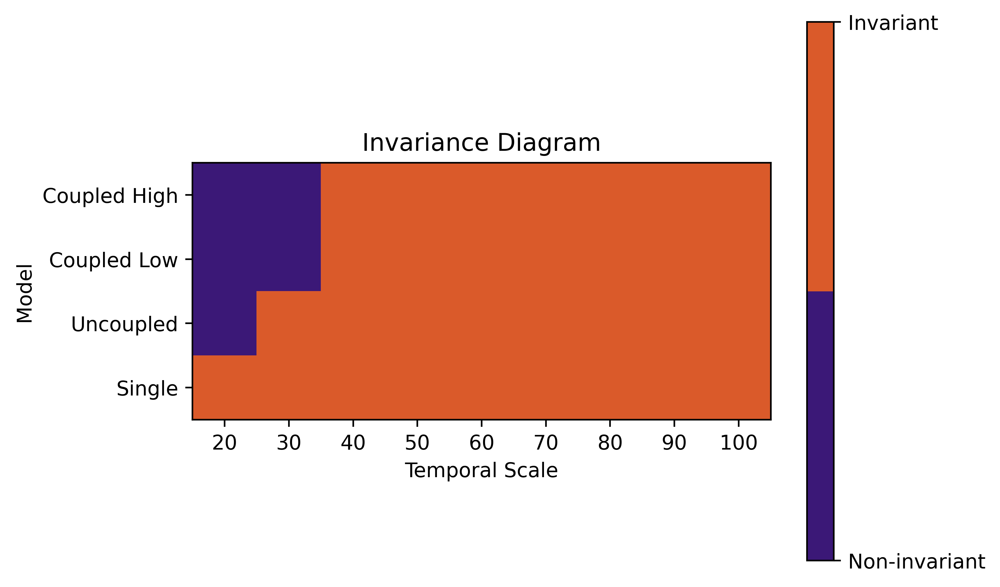

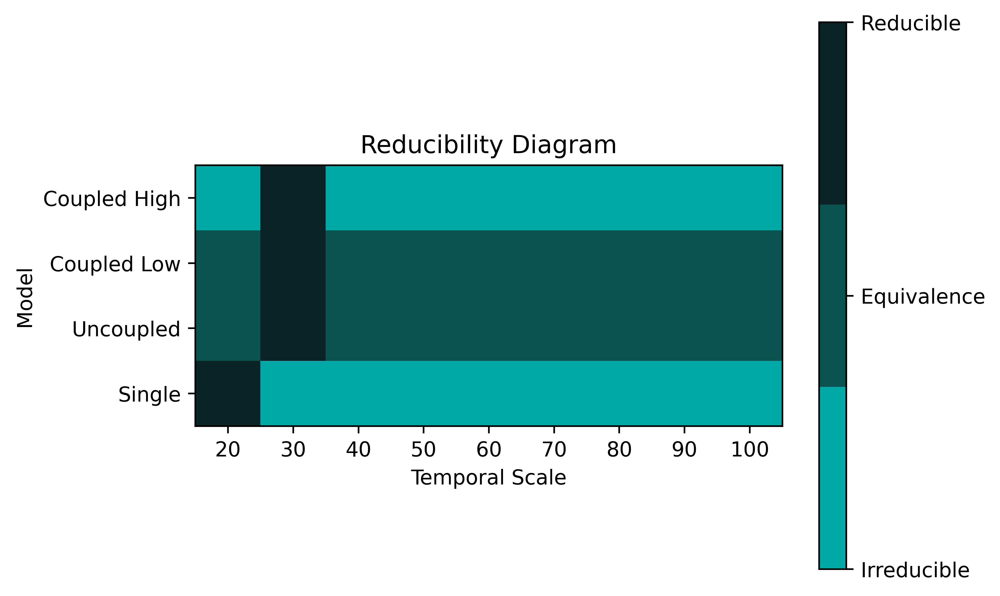

In [50]:
plotDiagrams(lambda005)

In [51]:
lambda005 = pd.read_excel("results_lambda=0.05.xlsx") 
lambda05 = pd.read_excel("results_lambda=0.5.xlsx") 
lambda1 = pd.read_excel("results_lambda=1.xlsx")
lambda15 = pd.read_excel("results_lambda=1.5.xlsx")

In [52]:
del lambda005["Unnamed: 0"]
del lambda05["Unnamed: 0"]
del lambda1["Unnamed: 0"]
del lambda15["Unnamed: 0"]

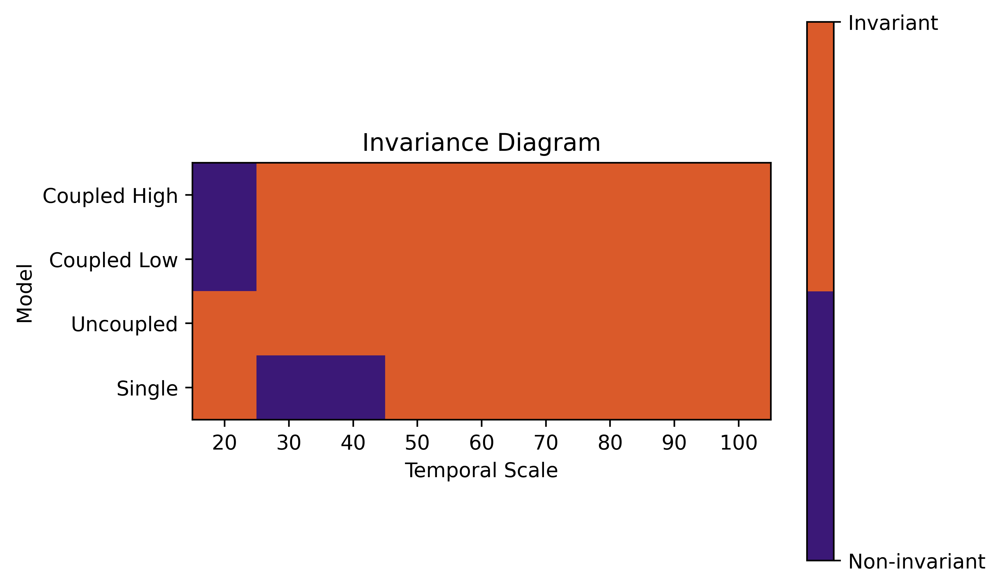

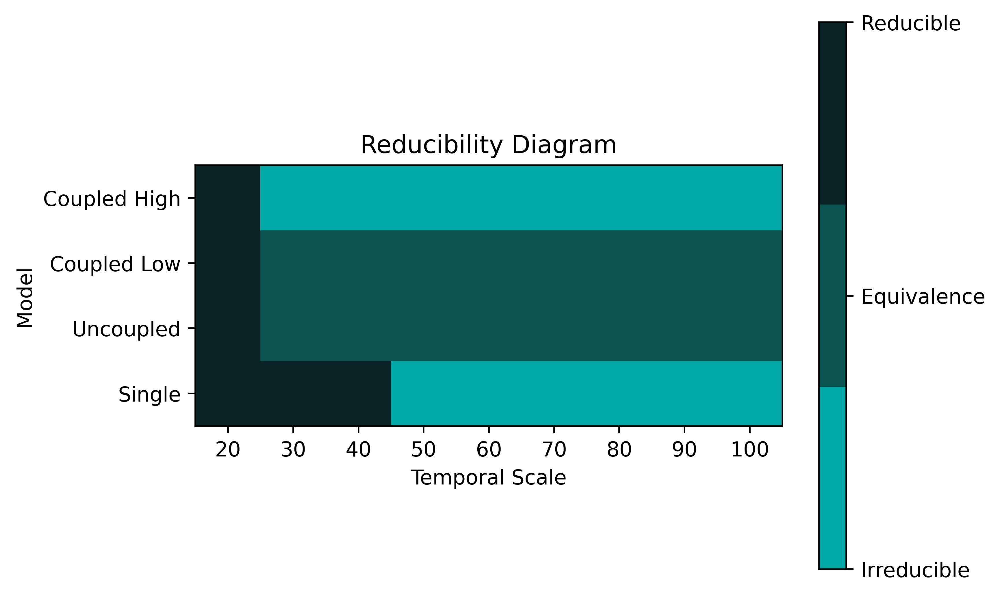

In [53]:
plotDiagrams(lambda05)

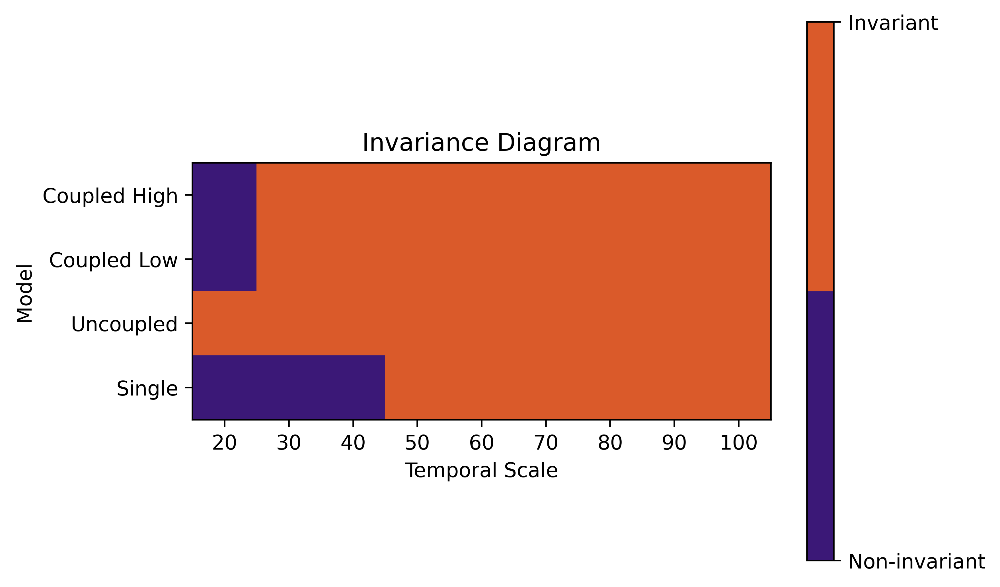

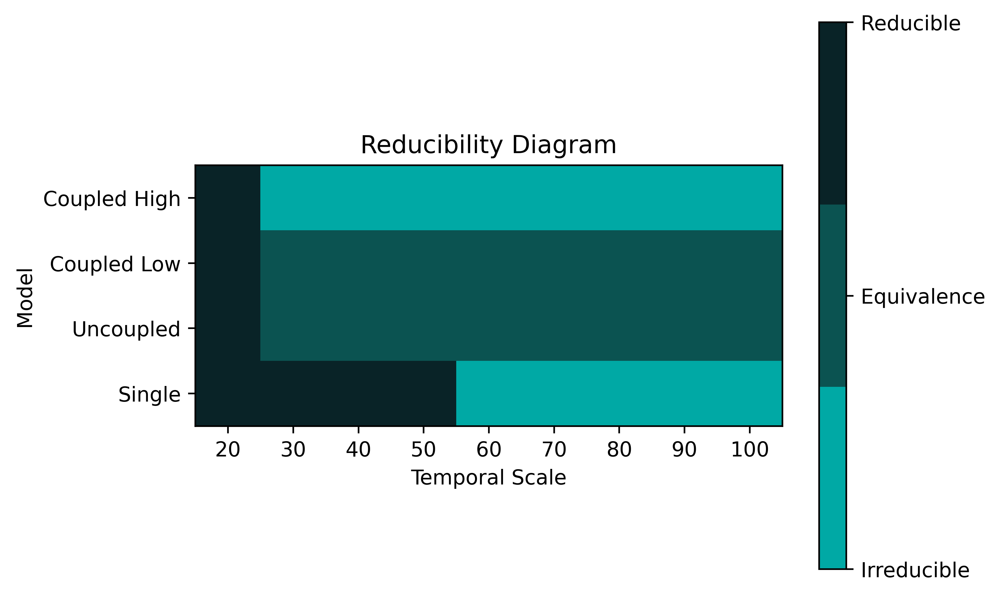

In [54]:
plotDiagrams(lambda1)

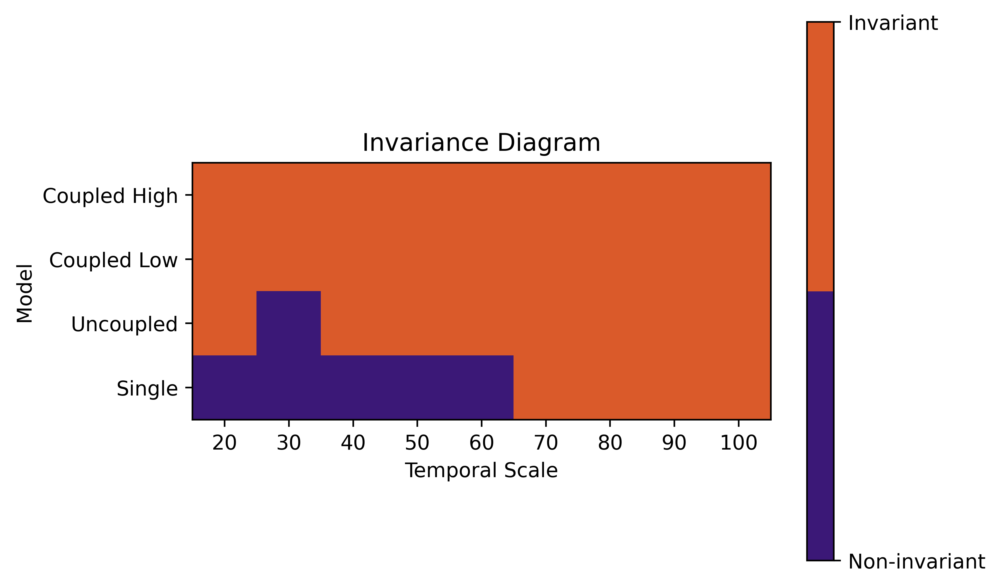

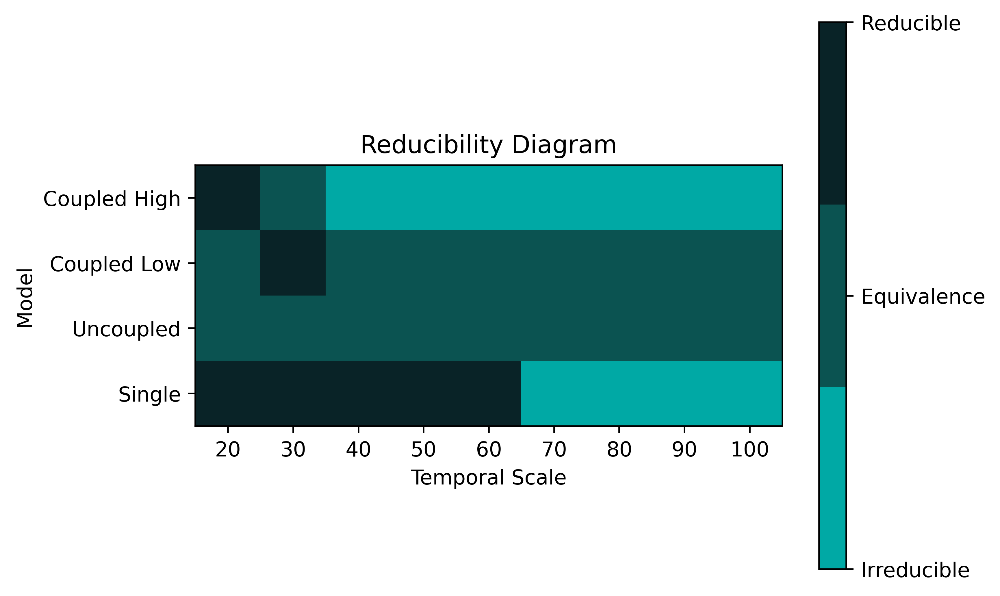

In [55]:
plotDiagrams(lambda15)

In [5]:
def plotEff(dataframe, lambda_p):
    L = [20, 30, 40, 50, 60, 70, 80, 90, 100]
    plt.title(f"Prediction Capacity for lambda={lambda_p}")
    plt.xlabel('Oscillatory Level')
    plt.ylabel('Average Efficiency')
    for model in list(Models.keys()):
        A = []
        for level in Levels:
            av = dataframe.loc[(dataframe['Model'] == model) & (dataframe['Oscillatory Level'] == level), 'RMSE (test)'].mean()
            A.append(av)
        plt.plot(L, A, label=Models[model])
        plt.legend()

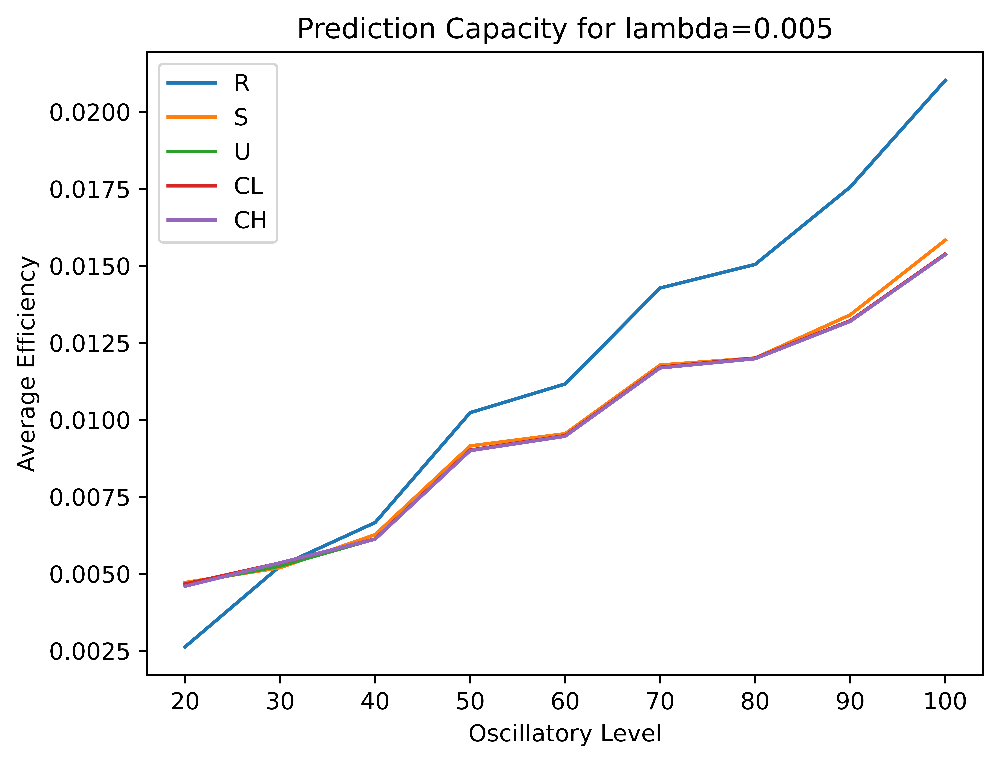

In [6]:
plotEff(lambda005, 0.005)

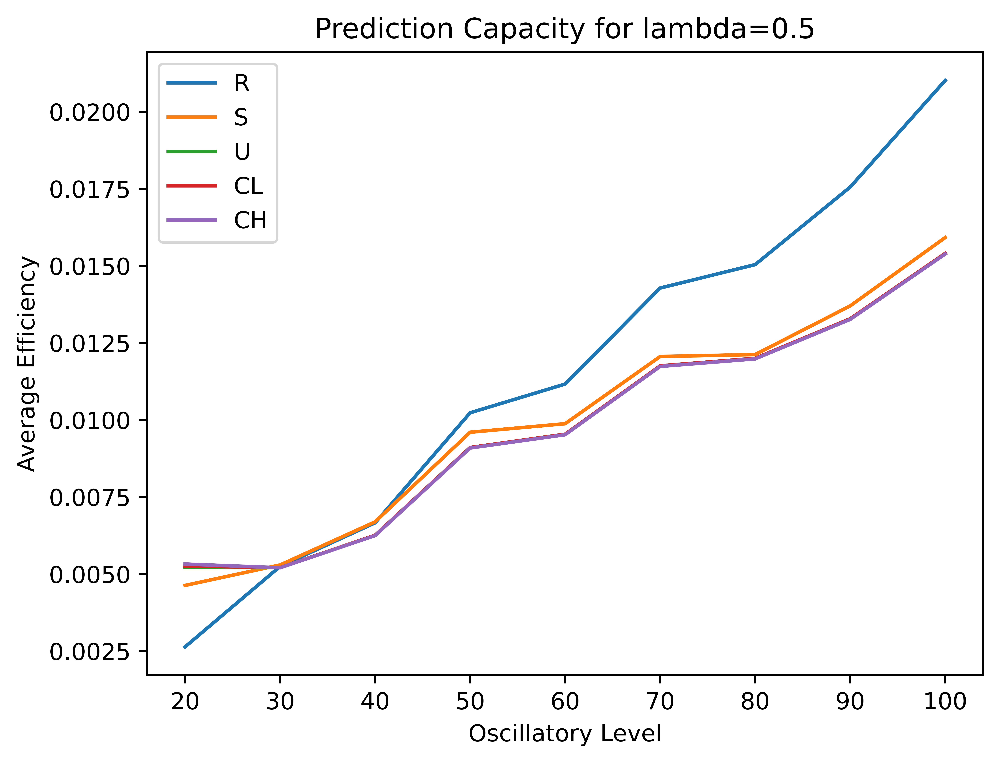

In [7]:
plotEff(lambda05, 0.5)

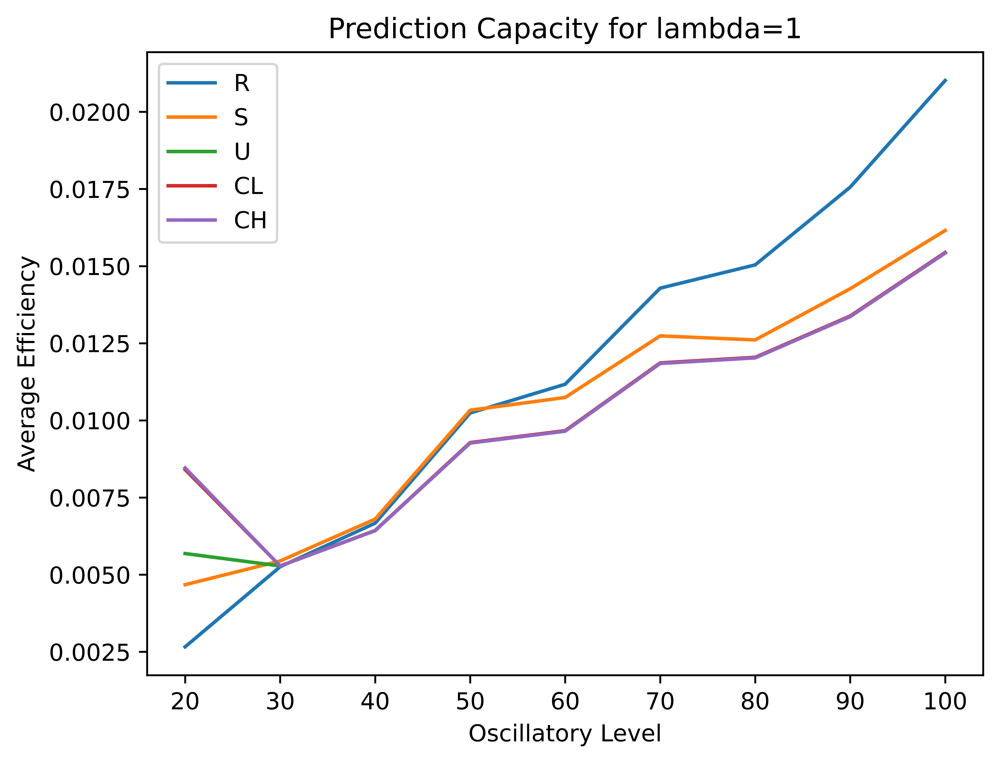

In [8]:
plotEff(lambda1, 1)

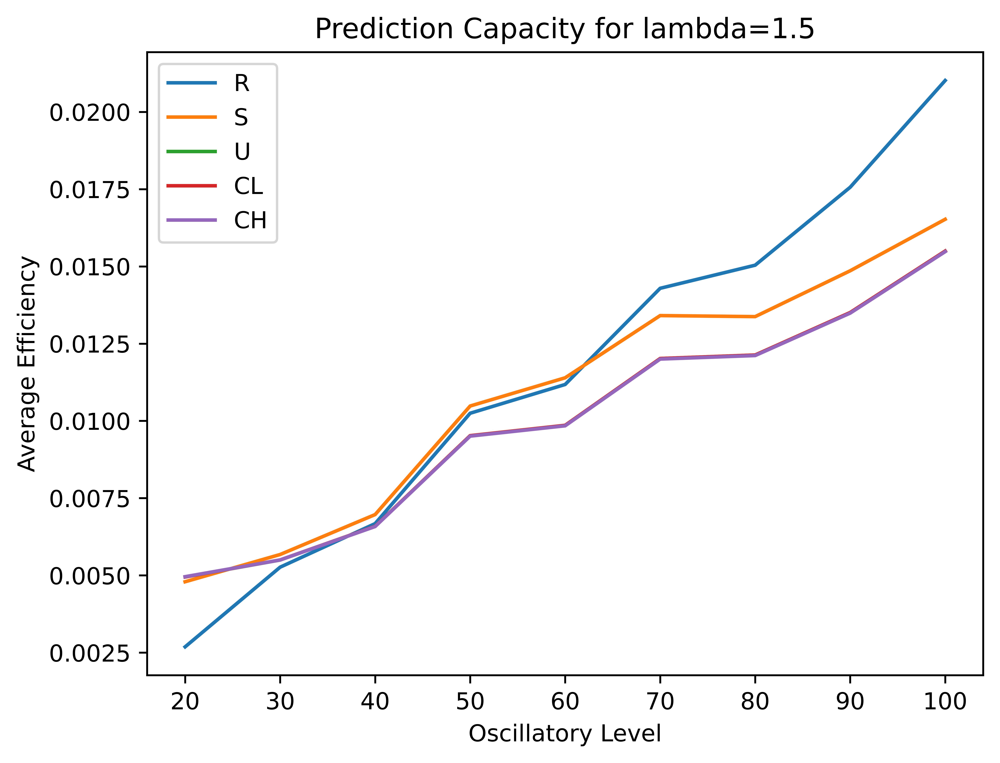

In [9]:
plotEff(lambda15, 1.5)

In [10]:
def plotEff2(model):
    L = [20, 30, 40, 50, 60, 70, 80, 90, 100]
    lambdas = [0.005, 0.5, 1, 1.5]
    dataframes = [lambda005, lambda05, lambda1, lambda15]
    plt.title(f"Prediction Capacity using {model}")
    plt.xlabel('Oscillatory Level')
    plt.ylabel('Average Efficiency')
    for i in range(len(dataframes)):
        dataframe = dataframes[i]
        A = []
        for level in Levels:
            av = dataframe.loc[(dataframe['Model'] == model) & (dataframe['Oscillatory Level'] == level), 'RMSE (test)'].mean()
            A.append(av)
        plt.plot(L, A, label=lambdas[i])
        plt.legend()

In [ ]:
Models = {'Ridge Regression' : 'R', 'Single Oscillator' : 'S', 'Uncoupled Oscillators' : 'U', 
          'Coupled Oscillators (low)' : 'CL',  'Coupled Oscillators (high)' : 'CH'}

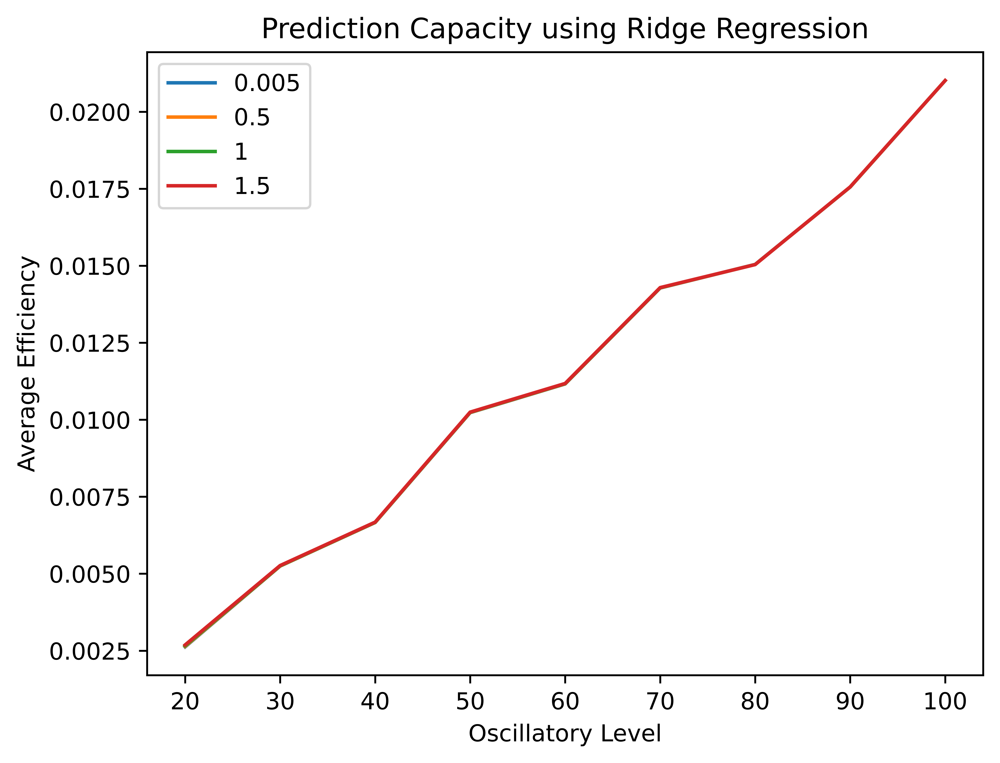

In [11]:
plotEff2('Ridge Regression')

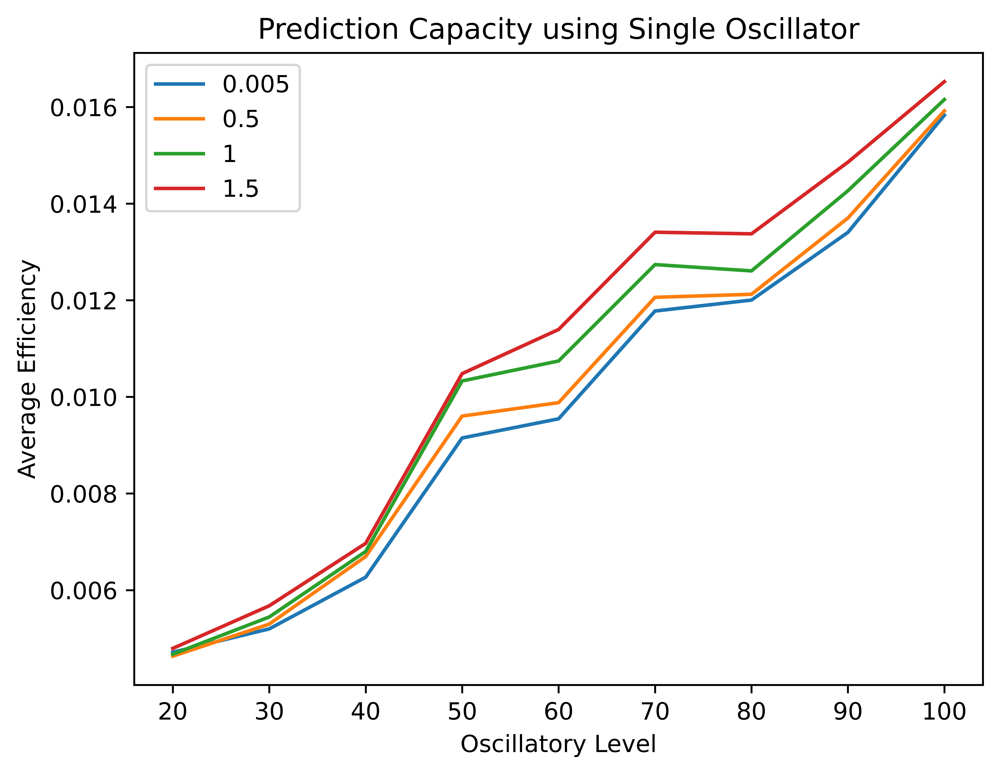

In [12]:
plotEff2('Single Oscillator')

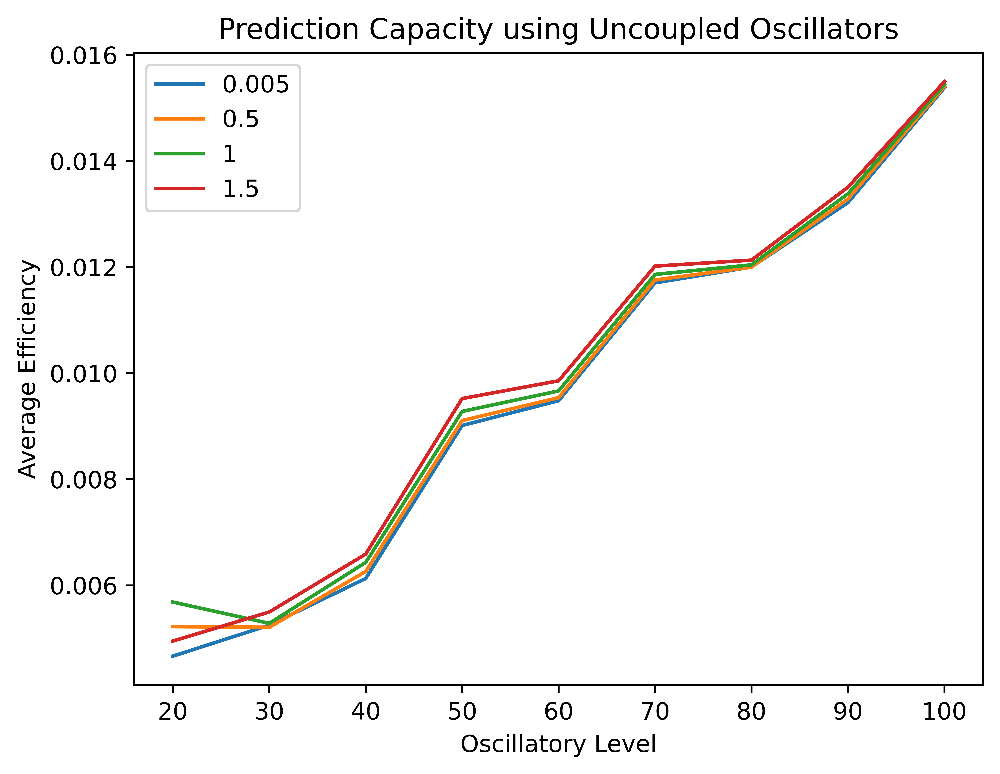

In [13]:
plotEff2('Uncoupled Oscillators')

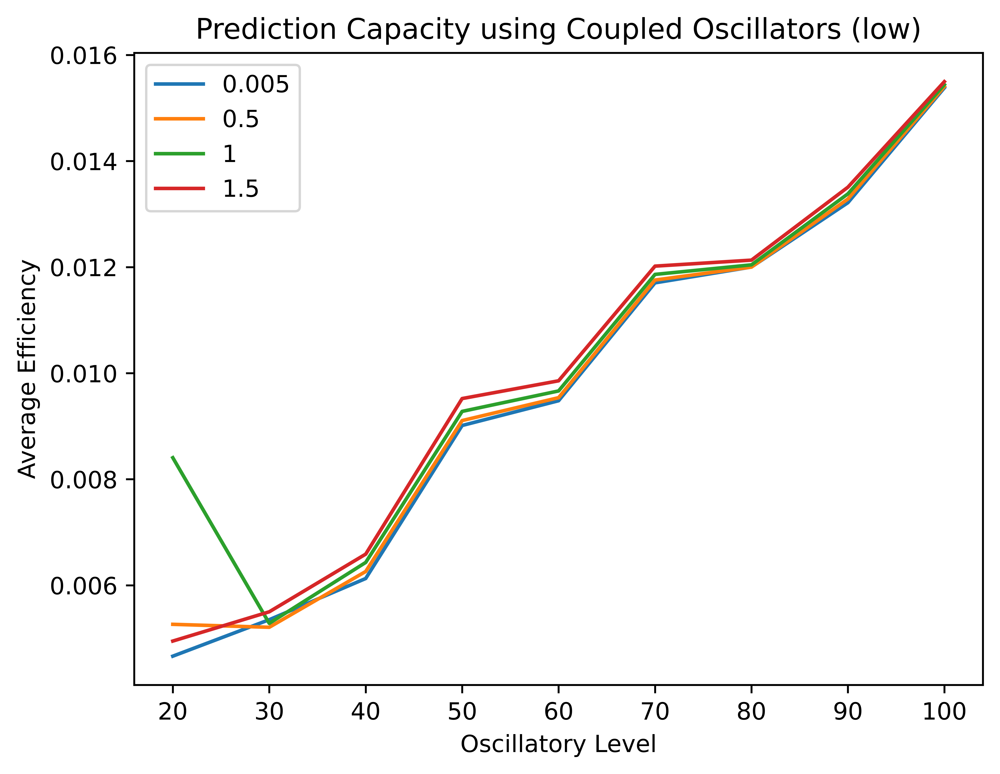

In [14]:
plotEff2('Coupled Oscillators (low)')

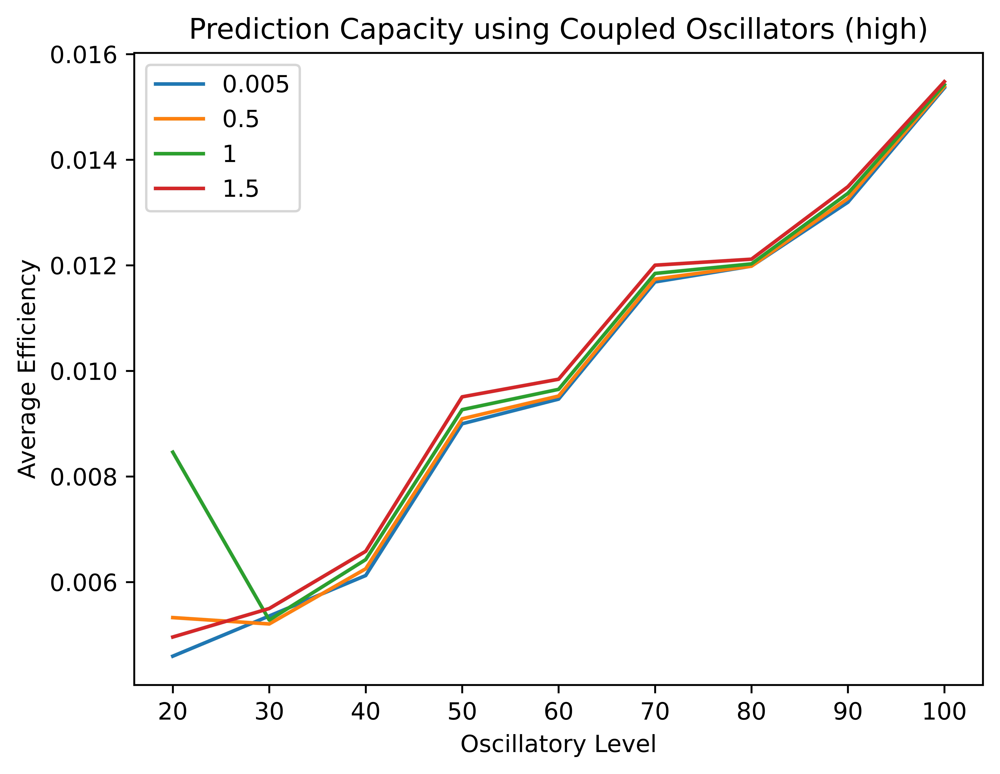

In [15]:
plotEff2('Coupled Oscillators (high)')